In [6]:
import os
import sys
import json
import numpy as np

import matplotlib.pyplot as plt

sys.path.append("..")
import scripts.create_overview as create_overview

In [7]:
args = {
    "data_path": "/Volumes/Extreme_SSD/MegaDepth/scenes/",
    "output": "../data/metrics_overview.json",
}

# convert to argparse.Namespace
args = type("Namespace", (object,), args)


create_overview.main(args)

metrics = json.load(open("../data/metrics_overview.json"))

scenes = list(metrics.keys())
print(f"Loaded {len(scenes)} scenes")

Loaded 38 scenes


In [8]:
def plot_metric(metrics, scene):
    keys = [
        "n_reg_images", 
        "perc_reg_images", 
        "mean_reprojection_error", 
        "n_observations", 
        "mean_obs_per_reg_image", 
        "mean_track_length",
        "mean_overlap"
    ]
    
    labels = []
    for m in metrics[scene]:
        if "model_name" in m.keys():
            labels.append(m["model_name"])
        else:
            labels.append(f"{m['features']}-{m['matcher']}")

    fig, ax = plt.subplots(4, 2, figsize=(30, 30))
    colors = ["red", "green", "blue", "orange", "purple", "brown", "pink", "gray", "olive", "cyan"]
    
    ids = np.argsort(labels)
    labels = [labels[i] for i in ids]
    
    for i, metric in enumerate(keys):
        values = [m[metric] for m in metrics[scene]]

        values = [values[i] for i in ids]

        ax[i // 2, i % 2].bar(labels, values)

        
        # rotate labels
        for tick in ax[i // 2, i % 2].get_xticklabels():
            tick.set_rotation(10)
        
        ax[i // 2, i % 2].set_title(metric)
        
    
    plt.suptitle(f"Scene {scene}-sparse")
    plt.show()

In [9]:
scene = "0022"


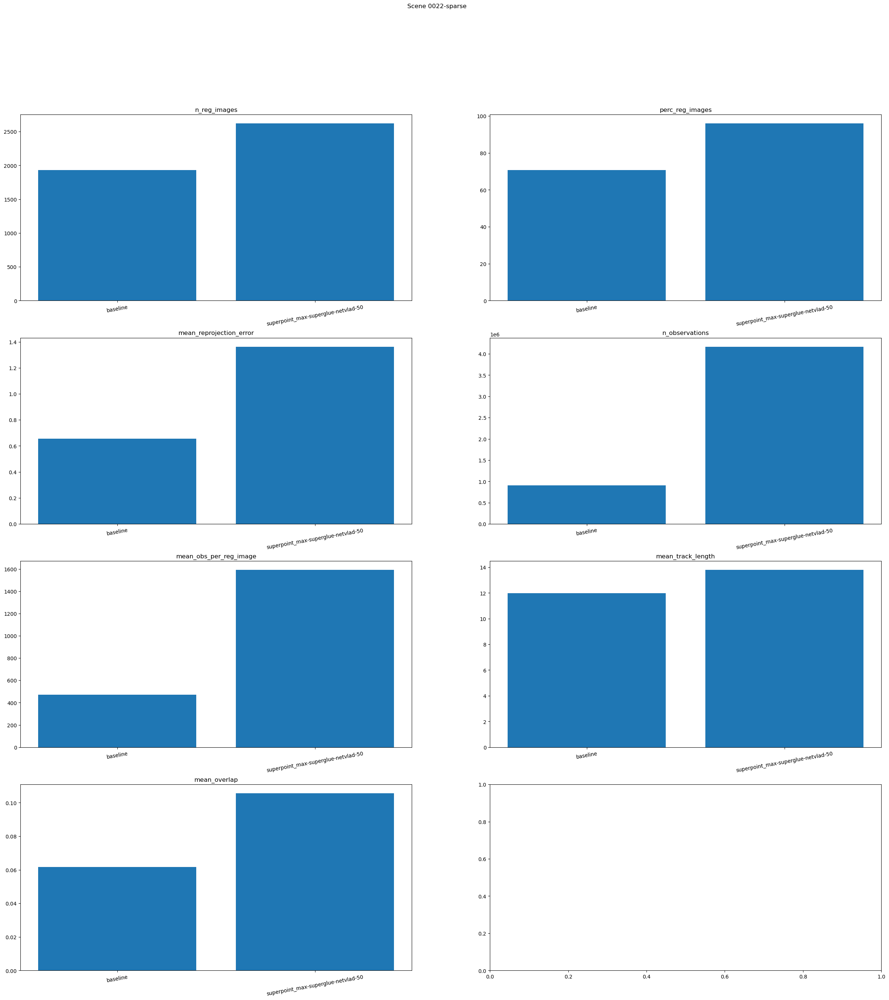

In [10]:
plot_metric(metrics, scene)

In [11]:
n_images = metrics[scene][0]["n_images"]

base_reg_images = next(m for m in metrics[scene] if m["model_name"] == "baseline")["n_reg_images"]
base_perc_reg_images = next(m for m in metrics[scene] if m["model_name"] == "baseline")["perc_reg_images"]

try:
    super_reg_images = next(m for m in metrics[scene] if m["model_name"] == "superpoint_max-superglue-netvlad-50")["n_reg_images"]
    super_perc_reg_images = next(m for m in metrics[scene] if m["model_name"] == "superpoint_max-superglue-netvlad-50")["perc_reg_images"]
    super_name = "superpoint_max-superglue-netvlad-50"
except Exception as e:
    try:
        super_reg_images = next(m for m in metrics[scene] if m["model_name"] == "superpoint_max-superglue-exhaustive-50")["n_reg_images"]
        super_perc_reg_images = next(m for m in metrics[scene] if m["model_name"] == "superpoint_max-superglue-exhaustive-50")["perc_reg_images"]
        super_name = "superpoint_max-superglue-exhaustive-50"
    except Exception as e:
        super_reg_images = next(m for m in metrics[scene] if m["model_name"] == "superpoint_max-superglue-exhaustive")["n_reg_images"]
        super_perc_reg_images = next(m for m in metrics[scene] if m["model_name"] == "superpoint_max-superglue-exhaustive")["perc_reg_images"]
        super_name = "superpoint_max-superglue-exhaustive"
except:
    raise ValueError("Could not find superpoint model")


print(f"Num images: {n_images}")
print(f"Baseline:   {base_reg_images} ({base_perc_reg_images:.2f}%)")
print(f"Superpoint: {super_reg_images} ({super_perc_reg_images:2f}%)")

Num images: 2730
Baseline:   1930 (70.70%)
Superpoint: 2620 (95.970696%)


In [12]:
base_obs = next(m for m in metrics[scene] if m["model_name"] == "baseline")["n_observations"]
super_obs = next(m for m in metrics[scene] if m["model_name"] == super_name)["n_observations"]

print("Num observations")
print(f"Baseline:         {base_obs}")
print(f"Superpoint:       {super_obs}")

Num observations
Baseline:         909599
Superpoint:       4166980


In [13]:
base_mean_obs = next(m for m in metrics[scene] if m["model_name"] == "baseline")["mean_obs_per_reg_image"]
super_mean_obs = next(m for m in metrics[scene] if m["model_name"] == super_name)["mean_obs_per_reg_image"]

print("Mean observations per registered image")
print(f"Baseline:         {base_mean_obs}")
print(f"Superpoint:       {super_mean_obs}")

Mean observations per registered image
Baseline:         471.29481865284976
Superpoint:       1590.4503816793892


# Visualize Results

In [14]:
from pathlib import Path

import pycolmap
from hloc import visualization
from hloc.utils import viz_3d

data_path = Path("/Volumes/Extreme_SSD/MegaDepth/scenes/")
# data_path = Path("../data")

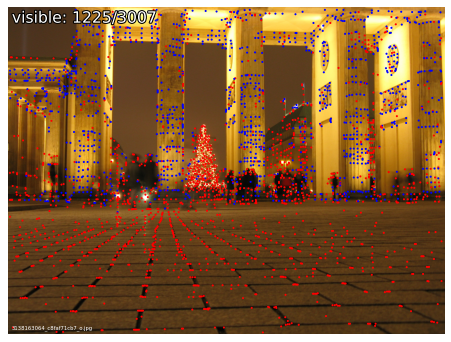

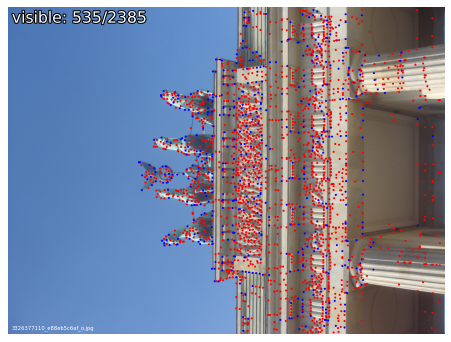

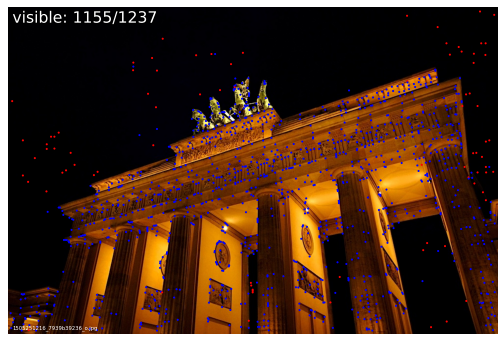

In [15]:
model_path = Path(os.path.join(data_path, scene, "sparse", super_name))
img_path = Path(os.path.join(data_path, scene, "images"))

model = pycolmap.Reconstruction(model_path)

visualization.visualize_sfm_2d(model, img_path, color_by='visibility', n=3)

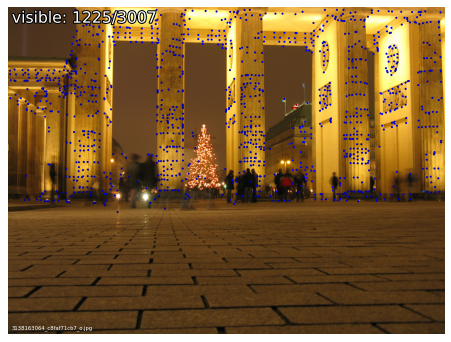

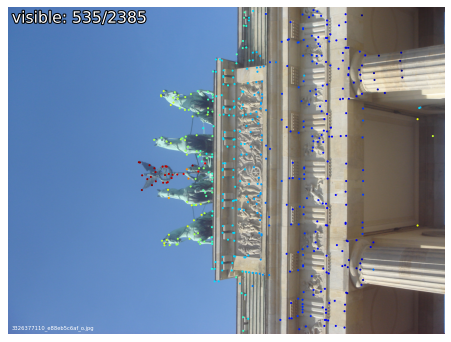

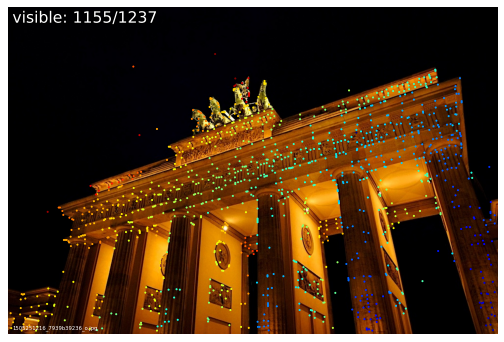

In [16]:
visualization.visualize_sfm_2d(model, img_path, color_by='depth', n=3)

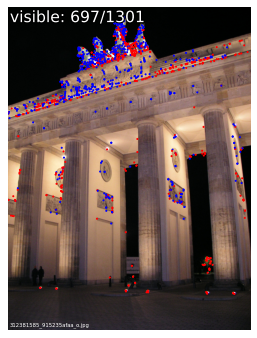

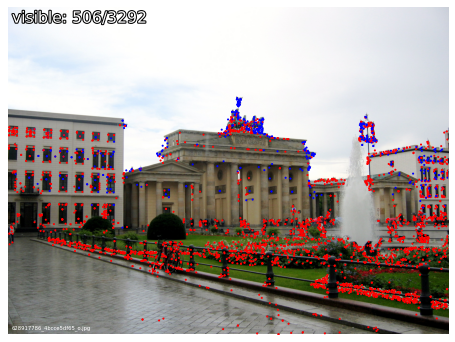

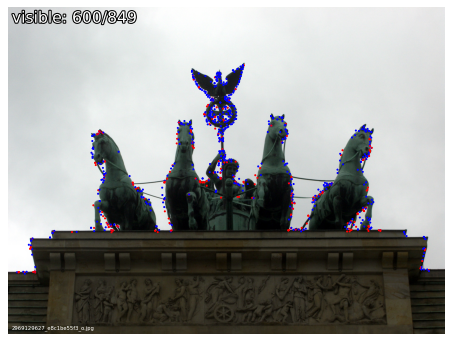

In [17]:
model_path = Path(os.path.join(data_path, scene, "sparse", "baseline"))

model = pycolmap.Reconstruction(model_path)

visualization.visualize_sfm_2d(model, img_path, color_by='visibility', n=3)

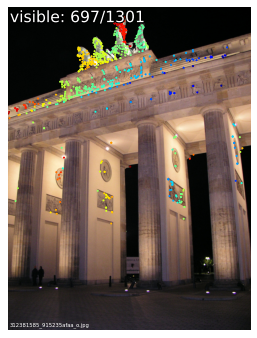

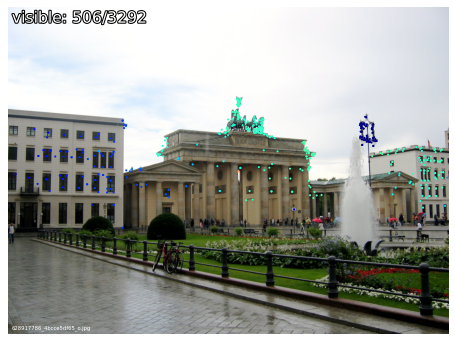

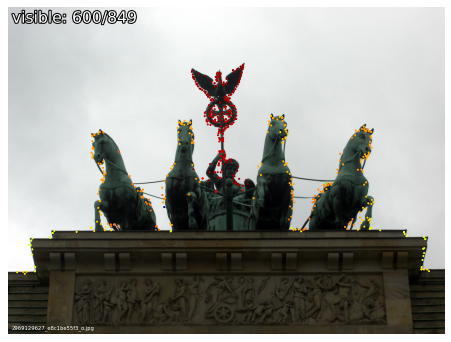

In [18]:
visualization.visualize_sfm_2d(model, img_path, color_by='depth', n=3)

# Show Unregistered Images

In [19]:
super_path = Path(os.path.join(data_path, scene, "sparse", super_name))
base_path = Path(os.path.join(data_path, scene, "sparse", "baseline"))

super_model = pycolmap.Reconstruction(super_path)
base_model = pycolmap.Reconstruction(base_path)

In [20]:
images = os.listdir(img_path)
print(f"Scene {scene} has {len(images)} images")

Scene 0022 has 2730 images


In [21]:
images_supermodel = [i.name for i in super_model.images.values()]
images_basemodel = [i.name for i in base_model.images.values()]

print(f"Superpoint model has {len(images_supermodel)} images")
print(f"Baseline model has {len(images_basemodel)} images")

Superpoint model has 2620 images
Baseline model has 1930 images


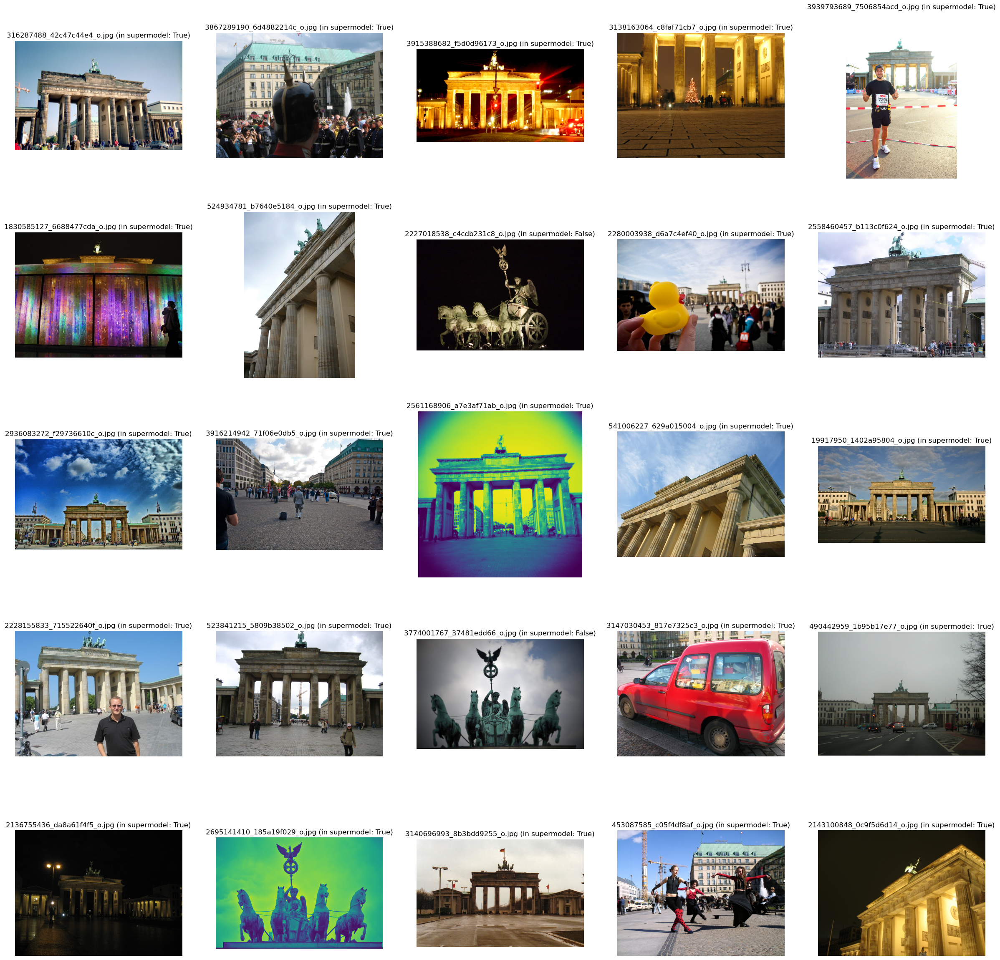

In [22]:
# get 25 random images that are not in the baseline model
unregistered_images = np.random.choice([i for i in images if i not in images_basemodel], 25)

fig, ax = plt.subplots(5, 5, figsize=(30, 30))
for i, image in enumerate(unregistered_images):
    ax[i // 5, i % 5].imshow(plt.imread(os.path.join(img_path, image)))
    in_supermodel = image in images_supermodel
    ax[i // 5, i % 5].set_title(f"{image} (in supermodel: {in_supermodel})")
    ax[i // 5, i % 5].axis("off")

plt.show()

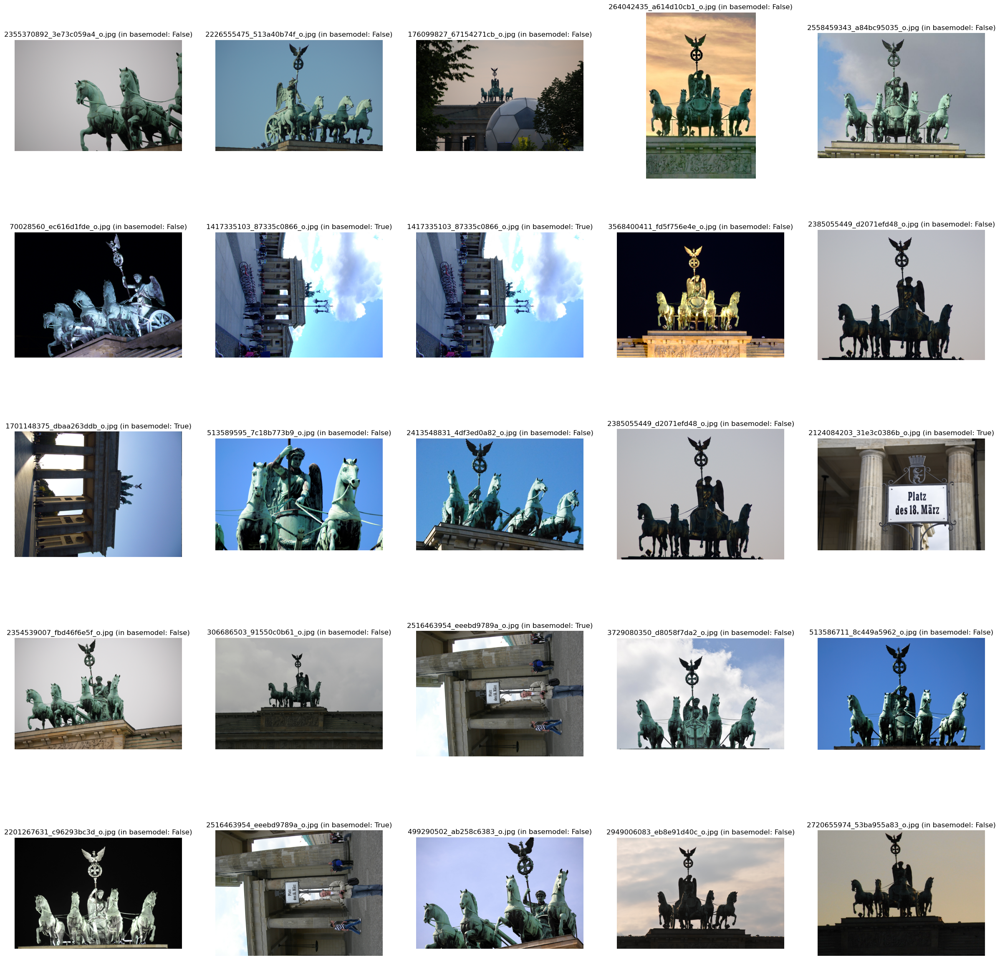

In [23]:
# get 25 random images that are not in the superpoint model
unregistered_images = np.random.choice([i for i in images if i not in images_supermodel], 25)

fig, ax = plt.subplots(5, 5, figsize=(30, 30))
for i, image in enumerate(unregistered_images):
    ax[i // 5, i % 5].imshow(plt.imread(os.path.join(img_path, image)))
    in_basemodel = image in images_basemodel
    ax[i // 5, i % 5].set_title(f"{image} (in basemodel: {in_basemodel})")
    ax[i // 5, i % 5].axis("off")

plt.show()

In [24]:
# fig = viz_3d.init_figure(height=400)
# viz_3d.plot_reconstruction(fig, super_model, name="superpoint")
# fig.show()

In [25]:
# fig = viz_3d.init_figure(height=400)
# viz_3d.plot_reconstruction(fig, base_model, name="baseline")
# fig.show()

In [26]:
base_overlap_name = [m["overlap_fn"] for m in metrics[scene] if m["model_name"] == "baseline"][0]
super_overlap_name = [m["overlap_fn"] for m in metrics[scene] if m["model_name"] == super_name][0]

In [27]:
base_sparse_overlap_matrix = np.load(os.path.join(data_path, scene, "metrics", "baseline", base_overlap_name))
super_sparse_overlap_matrix = np.load(os.path.join(data_path, scene, "metrics", super_name, super_overlap_name))

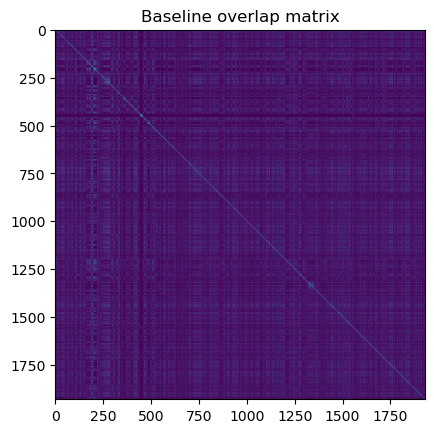

In [28]:
plt.imshow(base_sparse_overlap_matrix)
plt.title("Baseline overlap matrix")
plt.show()

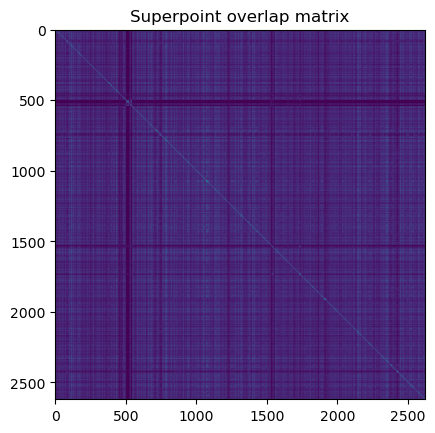

In [29]:
plt.imshow(super_sparse_overlap_matrix)
plt.title("Superpoint overlap matrix")
plt.show()

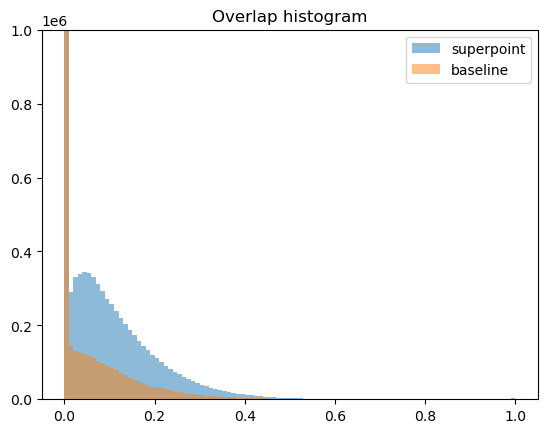

In [33]:
plt.hist(super_sparse_overlap_matrix.flatten(), bins=100, alpha=0.5, label="superpoint")
plt.hist(base_sparse_overlap_matrix.flatten(), bins=100, alpha=0.5, label="baseline")

plt.ylim(0, 1_000_000)

plt.title("Overlap histogram")
plt.legend()

plt.show()